In [1]:
import sys
sys.path.append('/home/shervin/Thesis/Code')
from gene_ontology_autoencoder.data import GDSCGeneExpressionData
from gene_ontology_autoencoder.models import GOAutoEncoder
import pickle
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader
import torch.optim as optim
import torch.nn as nn
from tqdm import tqdm
from sklearn.manifold import TSNE
import torch
from matplotlib import cm

In [2]:
with open('/home/shervin/Thesis/Code/storage/go_nn/network_data.pkl','rb') as f:
    network_data = pickle.load(f)
    masks = [network_data['input_mask'], network_data['mask_level_4_to_3'], network_data['mask_level_3_to_2']]
    output_go_terms = network_data['level_2_go_terms']
    del network_data

## Train

In [3]:
train_indices, test_indices = train_test_split(np.arange(1783), test_size=0.1, shuffle=True, random_state=42)

model = GOAutoEncoder(masks[0],masks[1], masks[2])
train_dataset = GDSCGeneExpressionData(train_indices)
val_dataset = GDSCGeneExpressionData(test_indices, scaler=train_dataset.scaler)
BATCH_SIZE = 512
train_loader = DataLoader(train_dataset, BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, BATCH_SIZE, shuffle=True)
# %%
optimizer = optim.Adam(model.parameters())
loss_fn = nn.MSELoss()

In [7]:
# if resume
state = torch.load('/home/shervin/Thesis/Code/gene_ontology_autoencoder/checkpoints/train_1/state.pt')
model.load_state_dict(state['weights'])
optimizer.load_state_dict(state['optimizer'])
del state

Epoch [1/210], loss:0.09445088170468807: 100%|██████████| 4/4 [00:06<00:00,  1.74s/it]


evaluating...
val_loss: 0.09555388987064362


Epoch [2/210], loss:0.09417301416397095: 100%|██████████| 4/4 [00:07<00:00,  1.89s/it]


evaluating...
val_loss: 0.09555953741073608


Epoch [3/210], loss:0.09446286223828793: 100%|██████████| 4/4 [00:06<00:00,  1.70s/it]


evaluating...
val_loss: 0.09556178748607635


Epoch [4/210], loss:0.09458787739276886: 100%|██████████| 4/4 [00:06<00:00,  1.73s/it]


evaluating...
val_loss: 0.09555879235267639


Epoch [5/210], loss:0.09361336566507816: 100%|██████████| 4/4 [00:07<00:00,  1.84s/it]


evaluating...
val_loss: 0.09556180238723755


Epoch [6/210], loss:0.0951208844780922: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it] 


evaluating...
val_loss: 0.09554748237133026


Epoch [7/210], loss:0.09515572525560856: 100%|██████████| 4/4 [00:06<00:00,  1.71s/it]


evaluating...
val_loss: 0.09553634375333786


Epoch [8/210], loss:0.09576337411999702: 100%|██████████| 4/4 [00:07<00:00,  1.83s/it]


evaluating...
val_loss: 0.09552286565303802


Epoch [9/210], loss:0.09509612433612347: 100%|██████████| 4/4 [00:07<00:00,  1.76s/it]


evaluating...
val_loss: 0.0955139622092247


Epoch [10/210], loss:0.09489709325134754: 100%|██████████| 4/4 [00:07<00:00,  1.89s/it]


evaluating...
val_loss: 0.0955074205994606


Epoch [11/210], loss:0.09406664967536926: 100%|██████████| 4/4 [00:07<00:00,  1.79s/it]


evaluating...
val_loss: 0.09550704807043076


Epoch [12/210], loss:0.09627355262637138: 100%|██████████| 4/4 [00:07<00:00,  1.76s/it]


evaluating...
val_loss: 0.09550340473651886


Epoch [13/210], loss:0.09514433890581131: 100%|██████████| 4/4 [00:06<00:00,  1.72s/it]


evaluating...
val_loss: 0.09550080448389053


Epoch [14/210], loss:0.09506007097661495: 100%|██████████| 4/4 [00:07<00:00,  1.97s/it]


evaluating...
val_loss: 0.09551135450601578


Epoch [15/210], loss:0.09425780363380909: 100%|██████████| 4/4 [00:06<00:00,  1.74s/it]


evaluating...
val_loss: 0.09550870209932327


Epoch [16/210], loss:0.09396327845752239: 100%|██████████| 4/4 [00:07<00:00,  1.78s/it]


evaluating...
val_loss: 0.09549371153116226


Epoch [17/210], loss:0.09391671605408192: 100%|██████████| 4/4 [00:07<00:00,  1.79s/it]


evaluating...
val_loss: 0.09547542780637741


Epoch [18/210], loss:0.09505458548665047: 100%|██████████| 4/4 [00:08<00:00,  2.09s/it]


evaluating...
val_loss: 0.09547798335552216


Epoch [19/210], loss:0.09462994337081909: 100%|██████████| 4/4 [00:09<00:00,  2.43s/it]


evaluating...
val_loss: 0.09545962512493134


Epoch [20/210], loss:0.09532422199845314: 100%|██████████| 4/4 [00:07<00:00,  1.84s/it]


evaluating...
val_loss: 0.09545663744211197


Epoch [21/210], loss:0.09460151381790638: 100%|██████████| 4/4 [00:07<00:00,  2.00s/it]


evaluating...
val_loss: 0.09546796977519989


Epoch [22/210], loss:0.09400001727044582: 100%|██████████| 4/4 [00:08<00:00,  2.10s/it]


evaluating...
val_loss: 0.09546180069446564


Epoch [23/210], loss:0.09461710415780544: 100%|██████████| 4/4 [00:08<00:00,  2.09s/it]


evaluating...
val_loss: 0.09545526653528214


Epoch [24/210], loss:0.09442191198468208: 100%|██████████| 4/4 [00:08<00:00,  2.07s/it]


evaluating...
val_loss: 0.09546227753162384


Epoch [25/210], loss:0.09434760361909866: 100%|██████████| 4/4 [00:08<00:00,  2.00s/it]


evaluating...
val_loss: 0.09546627849340439


Epoch [26/210], loss:0.0947495736181736: 100%|██████████| 4/4 [00:07<00:00,  1.94s/it] 


evaluating...
val_loss: 0.09546113759279251


Epoch [27/210], loss:0.09475857950747013: 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]


evaluating...
val_loss: 0.09545730799436569


Epoch [28/210], loss:0.09420315362513065: 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]


evaluating...
val_loss: 0.09544850140810013


Epoch [29/210], loss:0.0938555859029293: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it] 


evaluating...
val_loss: 0.0954316258430481


Epoch [30/210], loss:0.09436838515102863: 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]


evaluating...
val_loss: 0.09542291611433029


Epoch [31/210], loss:0.09497761726379395: 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]


evaluating...
val_loss: 0.09541641920804977


Epoch [32/210], loss:0.09560957364737988: 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]


evaluating...
val_loss: 0.0954209566116333


Epoch [33/210], loss:0.09562132135033607: 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]


evaluating...
val_loss: 0.09542032331228256


Epoch [34/210], loss:0.09417284838855267: 100%|██████████| 4/4 [00:08<00:00,  2.02s/it]


evaluating...
val_loss: 0.09542391449213028


Epoch [35/210], loss:0.09441911987960339: 100%|██████████| 4/4 [00:07<00:00,  1.81s/it]


evaluating...
val_loss: 0.09542303532361984


Epoch [36/210], loss:0.09511470980942249: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


evaluating...
val_loss: 0.09541652351617813


Epoch [37/210], loss:0.09477311745285988: 100%|██████████| 4/4 [00:07<00:00,  1.92s/it]


evaluating...
val_loss: 0.09541410952806473


Epoch [38/210], loss:0.09476516209542751: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


evaluating...
val_loss: 0.09540203213691711


Epoch [39/210], loss:0.0966918133199215: 100%|██████████| 4/4 [00:06<00:00,  1.62s/it] 


evaluating...
val_loss: 0.09539078176021576


Epoch [40/210], loss:0.09464607946574688: 100%|██████████| 4/4 [00:06<00:00,  1.63s/it]


evaluating...
val_loss: 0.09540452063083649


Epoch [41/210], loss:0.09582509100437164: 100%|██████████| 4/4 [00:07<00:00,  1.88s/it]


evaluating...
val_loss: 0.09539049118757248


Epoch [42/210], loss:0.09396914020180702: 100%|██████████| 4/4 [00:07<00:00,  1.78s/it]


evaluating...
val_loss: 0.09538090974092484


Epoch [43/210], loss:0.09606177546083927: 100%|██████████| 4/4 [00:07<00:00,  1.84s/it]


evaluating...
val_loss: 0.09537892788648605


Epoch [44/210], loss:0.09485186636447906: 100%|██████████| 4/4 [00:06<00:00,  1.72s/it]


evaluating...
val_loss: 0.09536648541688919


Epoch [45/210], loss:0.09555988945066929: 100%|██████████| 4/4 [00:06<00:00,  1.72s/it]


evaluating...
val_loss: 0.09537716209888458


Epoch [46/210], loss:0.09502136521041393: 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]


evaluating...
val_loss: 0.09538231790065765


Epoch [47/210], loss:0.09456595033407211: 100%|██████████| 4/4 [00:07<00:00,  1.83s/it]


evaluating...
val_loss: 0.09539256244897842


Epoch [48/210], loss:0.0944068506360054: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it] 


evaluating...
val_loss: 0.09539096802473068


Epoch [49/210], loss:0.09509131498634815: 100%|██████████| 4/4 [00:06<00:00,  1.63s/it]


evaluating...
val_loss: 0.09538093954324722


Epoch [50/210], loss:0.0940786860883236: 100%|██████████| 4/4 [00:06<00:00,  1.64s/it] 


evaluating...
val_loss: 0.09536751359701157


Epoch [51/210], loss:0.09380244463682175: 100%|██████████| 4/4 [00:06<00:00,  1.63s/it]


evaluating...
val_loss: 0.09535621106624603


Epoch [52/210], loss:0.09435663931071758: 100%|██████████| 4/4 [00:07<00:00,  1.79s/it]


evaluating...
val_loss: 0.0953422412276268


Epoch [53/210], loss:0.09484013356268406: 100%|██████████| 4/4 [00:08<00:00,  2.08s/it]


evaluating...
val_loss: 0.09533006697893143


Epoch [54/210], loss:0.09458734095096588: 100%|██████████| 4/4 [00:07<00:00,  1.75s/it]


evaluating...
val_loss: 0.09532748907804489


Epoch [55/210], loss:0.09529963321983814: 100%|██████████| 4/4 [00:07<00:00,  1.88s/it]


evaluating...
val_loss: 0.0953236073255539


Epoch [56/210], loss:0.09480643831193447: 100%|██████████| 4/4 [00:07<00:00,  1.79s/it]


evaluating...
val_loss: 0.0953221246600151


Epoch [57/210], loss:0.09486077353358269: 100%|██████████| 4/4 [00:07<00:00,  1.78s/it]


evaluating...
val_loss: 0.0953294187784195


Epoch [58/210], loss:0.09433703683316708: 100%|██████████| 4/4 [00:07<00:00,  1.82s/it]


evaluating...
val_loss: 0.09534015506505966


Epoch [59/210], loss:0.09446294233202934: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]


evaluating...
val_loss: 0.09534096717834473


Epoch [60/210], loss:0.09504465200006962: 100%|██████████| 4/4 [00:06<00:00,  1.64s/it]


evaluating...
val_loss: 0.09534250199794769


Epoch [61/210], loss:0.0945271234959364: 100%|██████████| 4/4 [00:06<00:00,  1.65s/it] 


evaluating...
val_loss: 0.09533766657114029


Epoch [62/210], loss:0.09523686021566391: 100%|██████████| 4/4 [00:07<00:00,  1.77s/it]


evaluating...
val_loss: 0.0953412652015686


Epoch [63/210], loss:0.09466456435620785: 100%|██████████| 4/4 [00:08<00:00,  2.05s/it]


evaluating...
val_loss: 0.09532885998487473


Epoch [64/210], loss:0.09456615149974823: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]


evaluating...
val_loss: 0.09532364457845688


Epoch [65/210], loss:0.09399089775979519: 100%|██████████| 4/4 [00:06<00:00,  1.62s/it]


evaluating...
val_loss: 0.09531939029693604


Epoch [66/210], loss:0.09422478824853897: 100%|██████████| 4/4 [00:06<00:00,  1.60s/it]


evaluating...
val_loss: 0.0953105166554451


Epoch [67/210], loss:0.09493894502520561: 100%|██████████| 4/4 [00:06<00:00,  1.62s/it]


evaluating...
val_loss: 0.09530261904001236


Epoch [68/210], loss:0.09444669261574745: 100%|██████████| 4/4 [00:06<00:00,  1.64s/it]


evaluating...
val_loss: 0.09529375284910202


Epoch [69/210], loss:0.09434372000396252: 100%|██████████| 4/4 [00:07<00:00,  1.77s/it]


evaluating...
val_loss: 0.09528683125972748


Epoch [70/210], loss:0.0949751902371645: 100%|██████████| 4/4 [00:07<00:00,  1.80s/it] 


evaluating...
val_loss: 0.09527353197336197


Epoch [71/210], loss:0.09471639804542065: 100%|██████████| 4/4 [00:06<00:00,  1.72s/it]


evaluating...
val_loss: 0.09527849406003952


Epoch [72/210], loss:0.09511634893715382: 100%|██████████| 4/4 [00:06<00:00,  1.62s/it]


evaluating...
val_loss: 0.09527587890625


Epoch [73/210], loss:0.09693311899900436: 100%|██████████| 4/4 [00:06<00:00,  1.63s/it]


evaluating...
val_loss: 0.0952850729227066


Epoch [74/210], loss:0.09466554410755634: 100%|██████████| 4/4 [00:07<00:00,  1.87s/it]


evaluating...
val_loss: 0.09527366608381271


Epoch [75/210], loss:0.09469220414757729: 100%|██████████| 4/4 [00:07<00:00,  1.86s/it]


evaluating...
val_loss: 0.09526407718658447


Epoch [76/210], loss:0.09486743435263634: 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]


evaluating...
val_loss: 0.0952487513422966


Epoch [77/210], loss:0.09373760782182217: 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]


evaluating...
val_loss: 0.09524719417095184


Epoch [78/210], loss:0.09395339339971542: 100%|██████████| 4/4 [00:06<00:00,  1.71s/it]


evaluating...
val_loss: 0.0952519103884697


Epoch [79/210], loss:0.09374767169356346: 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]


evaluating...
val_loss: 0.09524491429328918


Epoch [80/210], loss:0.09660833887755871: 100%|██████████| 4/4 [00:07<00:00,  1.91s/it]


evaluating...
val_loss: 0.09524117410182953


Epoch [81/210], loss:0.09418494254350662: 100%|██████████| 4/4 [00:06<00:00,  1.70s/it]


evaluating...
val_loss: 0.09523659944534302


Epoch [82/210], loss:0.09526963159441948: 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]


evaluating...
val_loss: 0.09523440152406693


Epoch [83/210], loss:0.09402299299836159: 100%|██████████| 4/4 [00:07<00:00,  1.77s/it]


evaluating...
val_loss: 0.09523852169513702


Epoch [84/210], loss:0.09310810267925262: 100%|██████████| 4/4 [00:07<00:00,  1.85s/it]


evaluating...
val_loss: 0.09523884207010269


Epoch [85/210], loss:0.09614194557070732: 100%|██████████| 4/4 [00:07<00:00,  1.76s/it]


evaluating...
val_loss: 0.09522886574268341


Epoch [86/210], loss:0.09429525770246983: 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]


evaluating...
val_loss: 0.09523312747478485


Epoch [87/210], loss:0.09345602616667747: 100%|██████████| 4/4 [00:07<00:00,  1.83s/it]


evaluating...
val_loss: 0.09523680061101913


Epoch [88/210], loss:0.09506879933178425: 100%|██████████| 4/4 [00:07<00:00,  1.83s/it]


evaluating...
val_loss: 0.09523820877075195


Epoch [89/210], loss:0.09375858306884766: 100%|██████████| 4/4 [00:06<00:00,  1.71s/it]


evaluating...
val_loss: 0.0952434167265892


Epoch [90/210], loss:0.0955326072871685: 100%|██████████| 4/4 [00:06<00:00,  1.72s/it] 


evaluating...
val_loss: 0.09524932503700256


Epoch [91/210], loss:0.09446725063025951: 100%|██████████| 4/4 [00:06<00:00,  1.75s/it]


evaluating...
val_loss: 0.09525961428880692


Epoch [92/210], loss:0.09335164166986942: 100%|██████████| 4/4 [00:07<00:00,  1.80s/it]


evaluating...
val_loss: 0.09524840116500854


Epoch [93/210], loss:0.09503623843193054: 100%|██████████| 4/4 [00:06<00:00,  1.64s/it]


evaluating...
val_loss: 0.09523390978574753


Epoch [94/210], loss:0.09343500435352325: 100%|██████████| 4/4 [00:07<00:00,  1.88s/it]


evaluating...
val_loss: 0.0952274352312088


Epoch [95/210], loss:0.09400888532400131: 100%|██████████| 4/4 [00:07<00:00,  1.76s/it]


evaluating...
val_loss: 0.09521382302045822


Epoch [96/210], loss:0.09479476138949394: 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]


evaluating...
val_loss: 0.09520717710256577


Epoch [97/210], loss:0.09404952824115753: 100%|██████████| 4/4 [00:08<00:00,  2.25s/it]


evaluating...
val_loss: 0.09520599991083145


Epoch [98/210], loss:0.09426943771541119: 100%|██████████| 4/4 [00:08<00:00,  2.15s/it]


evaluating...
val_loss: 0.0951920673251152


Epoch [99/210], loss:0.0946035198867321: 100%|██████████| 4/4 [00:07<00:00,  1.96s/it] 


evaluating...
val_loss: 0.09518854320049286


Epoch [100/210], loss:0.09478648938238621: 100%|██████████| 4/4 [00:07<00:00,  1.82s/it]


evaluating...
val_loss: 0.09518373757600784


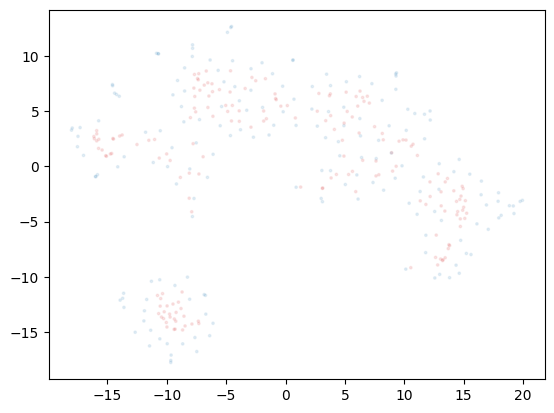

Epoch [101/210], loss:0.09451057389378548: 100%|██████████| 4/4 [00:07<00:00,  1.78s/it]


evaluating...
val_loss: 0.0951685979962349


Epoch [102/210], loss:0.09392614848911762: 100%|██████████| 4/4 [00:07<00:00,  1.86s/it]


evaluating...
val_loss: 0.09515990316867828


Epoch [103/210], loss:0.09468068741261959: 100%|██████████| 4/4 [00:07<00:00,  1.82s/it]


evaluating...
val_loss: 0.09514397382736206


Epoch [104/210], loss:0.0945849996060133: 100%|██████████| 4/4 [00:07<00:00,  1.94s/it] 


evaluating...
val_loss: 0.09515665471553802


Epoch [105/210], loss:0.09500474482774734: 100%|██████████| 4/4 [00:07<00:00,  1.79s/it]


evaluating...
val_loss: 0.09516825526952744


Epoch [106/210], loss:0.09400508366525173: 100%|██████████| 4/4 [00:07<00:00,  1.80s/it]


evaluating...
val_loss: 0.09516260027885437


Epoch [107/210], loss:0.09435692988336086: 100%|██████████| 4/4 [00:07<00:00,  1.81s/it]


evaluating...
val_loss: 0.09516085684299469


Epoch [108/210], loss:0.0949554592370987: 100%|██████████| 4/4 [00:07<00:00,  1.80s/it] 


evaluating...
val_loss: 0.09516546130180359


Epoch [109/210], loss:0.09418763592839241: 100%|██████████| 4/4 [00:07<00:00,  1.82s/it]


evaluating...
val_loss: 0.09515874087810516


Epoch [110/210], loss:0.09432263858616352: 100%|██████████| 4/4 [00:07<00:00,  1.85s/it]


evaluating...
val_loss: 0.09516310691833496


Epoch [111/210], loss:0.09434014745056629: 100%|██████████| 4/4 [00:07<00:00,  1.91s/it]


evaluating...
val_loss: 0.09514913707971573


Epoch [112/210], loss:0.0948424693197012: 100%|██████████| 4/4 [00:07<00:00,  1.81s/it] 


evaluating...
val_loss: 0.09513364732265472


Epoch [113/210], loss:0.09451944939792156: 100%|██████████| 4/4 [00:07<00:00,  1.80s/it]


evaluating...
val_loss: 0.09513039886951447


Epoch [114/210], loss:0.09394158236682415: 100%|██████████| 4/4 [00:07<00:00,  1.83s/it]


evaluating...
val_loss: 0.09513194113969803


Epoch [115/210], loss:0.09409484826028347: 100%|██████████| 4/4 [00:07<00:00,  1.83s/it]


evaluating...
val_loss: 0.09513357281684875


Epoch [116/210], loss:0.09492367133498192: 100%|██████████| 4/4 [00:07<00:00,  1.83s/it]


evaluating...
val_loss: 0.09512373805046082


Epoch [117/210], loss:0.09435096196830273: 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]


evaluating...
val_loss: 0.095115065574646


Epoch [118/210], loss:0.09474561922252178: 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]


evaluating...
val_loss: 0.09511949867010117


Epoch [119/210], loss:0.09415348246693611: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


evaluating...
val_loss: 0.09511992335319519


Epoch [120/210], loss:0.09473866969347: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]   


evaluating...
val_loss: 0.09511714428663254


Epoch [121/210], loss:0.09517737291753292: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


evaluating...
val_loss: 0.09512638300657272


Epoch [122/210], loss:0.09393427707254887: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


evaluating...
val_loss: 0.09513061493635178


Epoch [123/210], loss:0.09502917341887951: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]


evaluating...
val_loss: 0.09513204544782639


Epoch [124/210], loss:0.09430434182286263: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


evaluating...
val_loss: 0.09512867778539658


Epoch [125/210], loss:0.09498137049376965: 100%|██████████| 4/4 [00:07<00:00,  1.77s/it]


evaluating...
val_loss: 0.09511496871709824


Epoch [126/210], loss:0.09478883072733879: 100%|██████████| 4/4 [00:07<00:00,  1.94s/it]


evaluating...
val_loss: 0.09510325640439987


Epoch [127/210], loss:0.09383883140981197: 100%|██████████| 4/4 [00:07<00:00,  1.87s/it]


evaluating...
val_loss: 0.09510219842195511


Epoch [128/210], loss:0.09396059438586235: 100%|██████████| 4/4 [00:07<00:00,  1.96s/it]


evaluating...
val_loss: 0.0950886458158493


Epoch [129/210], loss:0.09463321790099144: 100%|██████████| 4/4 [00:07<00:00,  1.93s/it]


evaluating...
val_loss: 0.09508170187473297


Epoch [130/210], loss:0.09453872218728065: 100%|██████████| 4/4 [00:07<00:00,  1.93s/it]


evaluating...
val_loss: 0.09507662802934647


Epoch [131/210], loss:0.09413575381040573: 100%|██████████| 4/4 [00:07<00:00,  1.90s/it]


evaluating...
val_loss: 0.09508036822080612


Epoch [132/210], loss:0.09443177655339241: 100%|██████████| 4/4 [00:07<00:00,  1.76s/it]


evaluating...
val_loss: 0.09508116543292999


Epoch [133/210], loss:0.09400562196969986: 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]


evaluating...
val_loss: 0.09507368505001068


Epoch [134/210], loss:0.0943348091095686: 100%|██████████| 4/4 [00:06<00:00,  1.64s/it] 


evaluating...
val_loss: 0.09506409615278244


Epoch [135/210], loss:0.09504991210997105: 100%|██████████| 4/4 [00:07<00:00,  1.82s/it]


evaluating...
val_loss: 0.09505739063024521


Epoch [136/210], loss:0.09475751966238022: 100%|██████████| 4/4 [00:07<00:00,  1.87s/it]


evaluating...
val_loss: 0.09505847096443176


Epoch [137/210], loss:0.09439652226865292: 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]


evaluating...
val_loss: 0.09506092220544815


Epoch [138/210], loss:0.0939513873308897: 100%|██████████| 4/4 [00:07<00:00,  1.88s/it] 


evaluating...
val_loss: 0.09505697339773178


Epoch [139/210], loss:0.09464117139577866: 100%|██████████| 4/4 [00:07<00:00,  1.87s/it]


evaluating...
val_loss: 0.09505615383386612


Epoch [140/210], loss:0.09421968087553978: 100%|██████████| 4/4 [00:07<00:00,  1.88s/it]


evaluating...
val_loss: 0.09504890441894531


Epoch [141/210], loss:0.09516979195177555: 100%|██████████| 4/4 [00:06<00:00,  1.71s/it]


evaluating...
val_loss: 0.09503253549337387


Epoch [142/210], loss:0.09297225251793861: 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]


evaluating...
val_loss: 0.09504777193069458


Epoch [143/210], loss:0.09439669363200665: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


evaluating...
val_loss: 0.09503535181283951


Epoch [144/210], loss:0.09437928162515163: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]


evaluating...
val_loss: 0.09503941982984543


Epoch [145/210], loss:0.09409983642399311: 100%|██████████| 4/4 [00:06<00:00,  1.70s/it]


evaluating...
val_loss: 0.09504503011703491


Epoch [146/210], loss:0.09417342953383923: 100%|██████████| 4/4 [00:07<00:00,  1.76s/it]


evaluating...
val_loss: 0.09504027664661407


Epoch [147/210], loss:0.09445514157414436: 100%|██████████| 4/4 [00:06<00:00,  1.73s/it]


evaluating...
val_loss: 0.09503339976072311


Epoch [148/210], loss:0.09460698068141937: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


evaluating...
val_loss: 0.09502249956130981


Epoch [149/210], loss:0.0939865093678236: 100%|██████████| 4/4 [00:06<00:00,  1.68s/it] 


evaluating...
val_loss: 0.09502313286066055


Epoch [150/210], loss:0.09402592107653618: 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]


evaluating...
val_loss: 0.0950140580534935


Epoch [151/210], loss:0.0941164381802082: 100%|██████████| 4/4 [00:06<00:00,  1.64s/it] 


evaluating...
val_loss: 0.09500595182180405


Epoch [152/210], loss:0.09378393366932869: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


evaluating...
val_loss: 0.09499811381101608


Epoch [153/210], loss:0.09366671741008759: 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]


evaluating...
val_loss: 0.094987653195858


Epoch [154/210], loss:0.09471205808222294: 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]


evaluating...
val_loss: 0.09498186409473419


Epoch [155/210], loss:0.09466996788978577: 100%|██████████| 4/4 [00:06<00:00,  1.63s/it]


evaluating...
val_loss: 0.0949762836098671


Epoch [156/210], loss:0.09387575276196003: 100%|██████████| 4/4 [00:06<00:00,  1.72s/it]


evaluating...
val_loss: 0.09497100859880447


Epoch [157/210], loss:0.09377476945519447: 100%|██████████| 4/4 [00:07<00:00,  1.85s/it]


evaluating...
val_loss: 0.09495653957128525


Epoch [158/210], loss:0.09523122757673264: 100%|██████████| 4/4 [00:07<00:00,  1.85s/it]


evaluating...
val_loss: 0.09495525807142258


Epoch [159/210], loss:0.09446519799530506: 100%|██████████| 4/4 [00:07<00:00,  1.76s/it]


evaluating...
val_loss: 0.094961017370224


Epoch [160/210], loss:0.09467031992971897: 100%|██████████| 4/4 [00:07<00:00,  1.80s/it]


evaluating...
val_loss: 0.09497256577014923


Epoch [161/210], loss:0.0940931886434555: 100%|██████████| 4/4 [00:07<00:00,  1.87s/it] 


evaluating...
val_loss: 0.09497320652008057


Epoch [162/210], loss:0.09342695772647858: 100%|██████████| 4/4 [00:07<00:00,  1.81s/it]


evaluating...
val_loss: 0.09497793763875961


Epoch [163/210], loss:0.0937877781689167: 100%|██████████| 4/4 [00:06<00:00,  1.68s/it] 


evaluating...
val_loss: 0.09497207403182983


Epoch [164/210], loss:0.09403886646032333: 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]


evaluating...
val_loss: 0.09497272968292236


Epoch [165/210], loss:0.09410333819687366: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]


evaluating...
val_loss: 0.0949678048491478


Epoch [166/210], loss:0.09426366910338402: 100%|██████████| 4/4 [00:07<00:00,  1.84s/it]


evaluating...
val_loss: 0.09495674818754196


Epoch [167/210], loss:0.09433806501328945: 100%|██████████| 4/4 [00:07<00:00,  1.83s/it]


evaluating...
val_loss: 0.09495315700769424


Epoch [168/210], loss:0.09486670605838299: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


evaluating...
val_loss: 0.0949464738368988


Epoch [169/210], loss:0.0934254601597786: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it] 


evaluating...
val_loss: 0.0949362963438034


Epoch [170/210], loss:0.0945777241140604: 100%|██████████| 4/4 [00:06<00:00,  1.68s/it] 


evaluating...
val_loss: 0.09493691474199295


Epoch [171/210], loss:0.0937829501926899: 100%|██████████| 4/4 [00:07<00:00,  1.76s/it] 


evaluating...
val_loss: 0.09494581073522568


Epoch [172/210], loss:0.09351382777094841: 100%|██████████| 4/4 [00:06<00:00,  1.71s/it]


evaluating...
val_loss: 0.09494650363922119


Epoch [173/210], loss:0.09502208232879639: 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]


evaluating...
val_loss: 0.09494654834270477


Epoch [174/210], loss:0.0937307346612215: 100%|██████████| 4/4 [00:06<00:00,  1.75s/it] 


evaluating...
val_loss: 0.09493730217218399


Epoch [175/210], loss:0.09404640644788742: 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]


evaluating...
val_loss: 0.09494110941886902


Epoch [176/210], loss:0.09473739564418793: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


evaluating...
val_loss: 0.09492054581642151


Epoch [177/210], loss:0.09423867426812649: 100%|██████████| 4/4 [00:06<00:00,  1.70s/it]


evaluating...
val_loss: 0.09491736441850662


Epoch [178/210], loss:0.0937599204480648: 100%|██████████| 4/4 [00:07<00:00,  1.87s/it] 


evaluating...
val_loss: 0.09490116685628891


Epoch [179/210], loss:0.09472797252237797: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]


evaluating...
val_loss: 0.09490714222192764


Epoch [180/210], loss:0.09368277713656425: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]


evaluating...
val_loss: 0.09491410106420517


Epoch [181/210], loss:0.09470070153474808: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]


evaluating...
val_loss: 0.09490998089313507


Epoch [182/210], loss:0.09397415816783905: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]


evaluating...
val_loss: 0.09490412473678589


Epoch [183/210], loss:0.09408575855195522: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]


evaluating...
val_loss: 0.0949011892080307


Epoch [184/210], loss:0.0940392017364502: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it] 


evaluating...
val_loss: 0.09490601718425751


Epoch [185/210], loss:0.09461375512182713: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]


evaluating...
val_loss: 0.09490340203046799


Epoch [186/210], loss:0.09425745159387589: 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]


evaluating...
val_loss: 0.09490044414997101


Epoch [187/210], loss:0.09360331669449806: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


evaluating...
val_loss: 0.09489340335130692


Epoch [188/210], loss:0.09583665989339352: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


evaluating...
val_loss: 0.09488312900066376


Epoch [189/210], loss:0.09460302628576756: 100%|██████████| 4/4 [00:08<00:00,  2.00s/it]


evaluating...
val_loss: 0.09487464278936386


Epoch [190/210], loss:0.09363755397498608: 100%|██████████| 4/4 [00:07<00:00,  1.83s/it]


evaluating...
val_loss: 0.09488414973020554


Epoch [191/210], loss:0.09394734911620617: 100%|██████████| 4/4 [00:07<00:00,  1.79s/it]


evaluating...
val_loss: 0.09489503502845764


Epoch [192/210], loss:0.09393448568880558: 100%|██████████| 4/4 [00:07<00:00,  1.81s/it]


evaluating...
val_loss: 0.09488895535469055


Epoch [193/210], loss:0.09397647716104984: 100%|██████████| 4/4 [00:06<00:00,  1.75s/it]


evaluating...
val_loss: 0.09488686919212341


Epoch [194/210], loss:0.09687849506735802: 100%|██████████| 4/4 [00:07<00:00,  1.78s/it]


evaluating...
val_loss: 0.09487221390008926


Epoch [195/210], loss:0.09429551847279072: 100%|██████████| 4/4 [00:07<00:00,  1.78s/it]


evaluating...
val_loss: 0.09486153721809387


Epoch [196/210], loss:0.09359723143279552: 100%|██████████| 4/4 [00:07<00:00,  1.79s/it]


evaluating...
val_loss: 0.09485425800085068


Epoch [197/210], loss:0.09308612160384655: 100%|██████████| 4/4 [00:07<00:00,  1.78s/it]


evaluating...
val_loss: 0.0948590561747551


Epoch [198/210], loss:0.09474208019673824: 100%|██████████| 4/4 [00:07<00:00,  1.80s/it]


evaluating...
val_loss: 0.09486936777830124


Epoch [199/210], loss:0.09408279694616795: 100%|██████████| 4/4 [00:07<00:00,  1.80s/it]


evaluating...
val_loss: 0.09486235678195953


Epoch [200/210], loss:0.09698392450809479: 100%|██████████| 4/4 [00:07<00:00,  1.79s/it]


evaluating...
val_loss: 0.0948699340224266


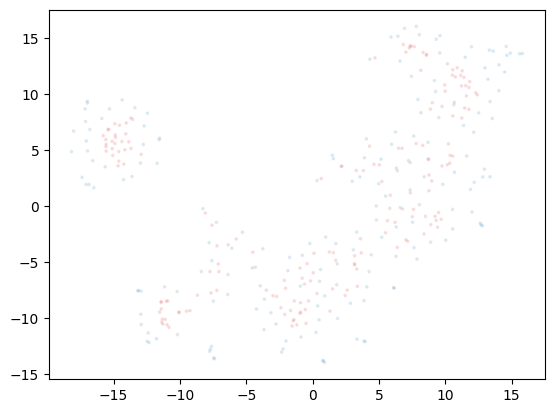

Epoch [201/210], loss:0.09394043684005737: 100%|██████████| 4/4 [00:07<00:00,  1.79s/it]


evaluating...
val_loss: 0.0948658436536789


Epoch [202/210], loss:0.09403546899557114: 100%|██████████| 4/4 [00:07<00:00,  1.78s/it]


evaluating...
val_loss: 0.0948624461889267


Epoch [203/210], loss:0.09436538442969322: 100%|██████████| 4/4 [00:07<00:00,  1.83s/it]


evaluating...
val_loss: 0.09486217051744461


Epoch [204/210], loss:0.09367488510906696: 100%|██████████| 4/4 [00:07<00:00,  1.80s/it]


evaluating...
val_loss: 0.09485553950071335


Epoch [205/210], loss:0.0942106805741787: 100%|██████████| 4/4 [00:07<00:00,  1.79s/it] 


evaluating...
val_loss: 0.09484050422906876


Epoch [206/210], loss:0.09588644281029701: 100%|██████████| 4/4 [00:07<00:00,  1.78s/it]


evaluating...
val_loss: 0.09483486413955688


Epoch [207/210], loss:0.09407872706651688: 100%|██████████| 4/4 [00:07<00:00,  1.80s/it]


evaluating...
val_loss: 0.0948275625705719


Epoch [208/210], loss:0.0938328169286251: 100%|██████████| 4/4 [00:07<00:00,  1.89s/it] 


evaluating...
val_loss: 0.09482254087924957


Epoch [209/210], loss:0.09387899748980999: 100%|██████████| 4/4 [00:07<00:00,  1.77s/it]


evaluating...
val_loss: 0.09480946511030197


Epoch [210/210], loss:0.0934749785810709: 100%|██████████| 4/4 [00:06<00:00,  1.67s/it] 


evaluating...
val_loss: 0.09481123834848404


In [14]:
PLOT_EVERY = 100
EPOCHS = 210
tsne = TSNE(n_components=2, perplexity=30)
for epoch in range(EPOCHS):
    train_running_loss = 0
    train_progress_bar = tqdm(enumerate(train_loader), total=len(train_loader))
    model.train()
    for batch_idx, batch in train_progress_bar:
        gene_expressions = batch['gene_expressions']
        labels = batch['labels']

        optimizer.zero_grad()
        x_hat = model(gene_expressions)
        loss = loss_fn(x_hat, gene_expressions)
        loss.backward()
        optimizer.step()
        train_running_loss += loss.item()
        train_progress_bar.set_description(f'Epoch [{epoch+1}/{EPOCHS}], loss:{train_running_loss/(batch_idx+1)}')

    print('evaluating...')
    model.eval()
    val_running_loss = 0
    
    all_val_expressions = []
    all_val_reconstructed = []
    with torch.no_grad():
        for batch in val_loader:
            gene_expressions = batch['gene_expressions']
            labels = batch['labels']
            
            x_hat = model(gene_expressions)
            all_val_expressions.append(gene_expressions)
            all_val_reconstructed.append(x_hat)

            loss = loss_fn(x_hat, gene_expressions)
            val_running_loss += loss.item()
    val_loss = val_running_loss / len(val_loader)
    print(f'val_loss: {val_loss}')
    if (epoch+1) % PLOT_EVERY == 0:
        all_val_expressions = torch.vstack(all_val_expressions).numpy()
        all_val_reconstructed = torch.vstack(all_val_reconstructed).numpy()
        all_data = np.concat([all_val_expressions, all_val_reconstructed], axis=0)
        tsne_embeddings = tsne.fit_transform(all_data)
        colors = ['tab:blue' if i< all_val_expressions.shape[0] else 'tab:red'  for i in range(all_data.shape[0])]
        plt.scatter(tsne_embeddings[:,0], tsne_embeddings[:,1], c=colors, s=3, alpha=0.1)
        plt.show()

In [15]:
torch.save({'weights':model.state_dict(), 'optimizer': optimizer.state_dict()}, '/home/shervin/Thesis/Code/gene_ontology_autoencoder/checkpoints/train_2/state.pt')

## Validate Model

In [3]:
model = GOAutoEncoder(masks[0],masks[1], masks[2])

In [4]:
state = torch.load('/home/shervin/Thesis/Code/gene_ontology_autoencoder/checkpoints/train_2/state.pt')
model.load_state_dict(state['weights'])
del state

In [5]:
dataset = GDSCGeneExpressionData()

In [6]:
BATCH_SIZE=512
loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=False)

In [7]:
all_expressions = []
all_embeddings = []
all_reconstructed = []
all_labels = []
model.eval()

with torch.no_grad():
    for batch in tqdm(loader):
        gene_expressions = batch['gene_expressions']
        labels = batch['labels']
        embeddings = model.encode(gene_expressions)
        reconstructed = model(gene_expressions)

        all_expressions.append(gene_expressions)
        all_labels.append(labels)
        all_reconstructed.append(reconstructed)
        all_embeddings.append(embeddings)
del batch

100%|██████████| 4/4 [00:03<00:00,  1.26it/s]


In [8]:
all_embeddings = torch.vstack(all_embeddings).numpy()
all_expressions = torch.vstack(all_expressions).numpy()
all_reconstructed = torch.vstack(all_reconstructed).numpy()
all_labels = torch.concat(all_labels, dim=0).numpy()

In [9]:
tsne = TSNE(n_components=2, perplexity=30)

all_data = np.concat([all_expressions, all_reconstructed], axis=0)
tsne_embeddings = tsne.fit_transform(all_data)

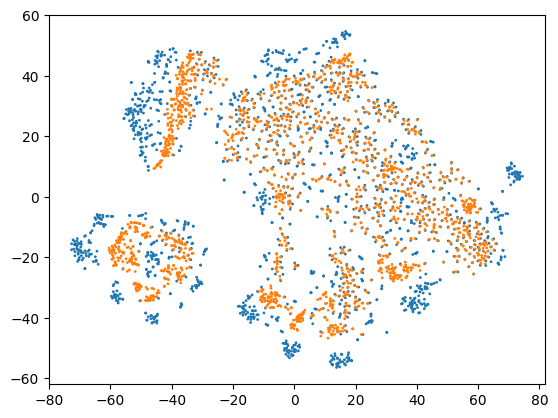

In [10]:
c = ['tab:blue' if i < all_expressions.shape[0] else 'tab:orange' for i in range(all_data.shape[0])]
plt.scatter(tsne_embeddings[:,0], tsne_embeddings[:,1], c=c, s=1)

In [11]:
tsne = TSNE(n_components=2, perplexity=30)
tsne_embeddings = tsne.fit_transform(all_embeddings)

In [12]:
from distinctipy import distinctipy
classes = dataset.classes
colors_rgb = distinctipy.get_colors(len(classes))

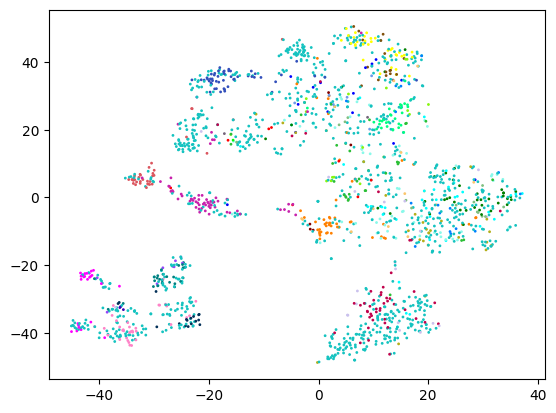

In [13]:
c = [colors_rgb[label_idx.item()] for label_idx in all_labels]
plt.scatter(tsne_embeddings[:,0], tsne_embeddings[:,1], s=1, c=c)
plt.show()

In [14]:
tsne_embeddings = tsne.fit_transform(all_expressions)

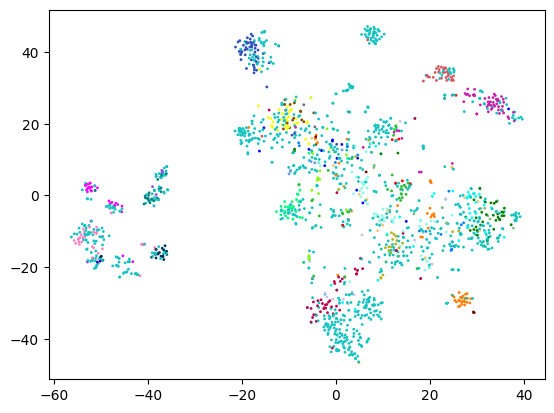

In [15]:
c = [colors_rgb[label_idx.item()] for label_idx in all_labels]
plt.scatter(tsne_embeddings[:,0], tsne_embeddings[:,1], s=1, c=c)
plt.show()

In [23]:
tsne_embeddings = tsne.fit_transform(all_reconstructed)

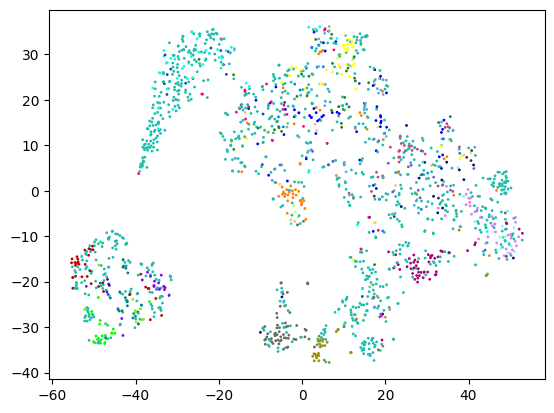

In [24]:
c = [colors_rgb[label_idx.item()] for label_idx in all_labels]
plt.scatter(tsne_embeddings[:,0], tsne_embeddings[:,1], s=1, c=c)
plt.show()

In [25]:
from goatools.obo_parser import GODag
go_dag = GODag("/home/shervin/Thesis/Code/storage/ontology/go-basic.obo")
output_go_terms_name = [go_dag[go_id].name for go_id in output_go_terms]
print(output_go_terms_name)
del go_dag

/home/shervin/Thesis/Code/storage/ontology/go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms
['ossification', 'morphogenesis of a branching structure', 'cell activation', 'leukocyte homeostasis', 'cytokine production', 'cell killing', 'somatic diversification of immune receptors', 'immune effector process', 'activation of immune response', 'B cell selection', 'production of molecular mediator of immune response', 'tolerance induction', 'production of molecular mediator involved in inflammatory response', 'developmental process involved in reproduction', 'system process', 'protein folding', 'vesicle targeting', 'syncytium formation', 'response to stress', 'immune response', 'microtubule-based process', 'cell cycle', 'cell communication', 'cell adhesion', 'establishment or maintenance of cell polarity', 'signal transduction', 'ensheathment of neurons', 'multicellular organism development', 'pattern specification process', 'behavior', 'circadian rhythm', 'cell recognition', 'metabolic p

  0%|          | 0/31 [00:00<?, ?it/s]/tmp/ipykernel_2558/1002282732.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('jet')
 65%|██████▍   | 20/31 [00:12<00:07,  1.57it/s]/tmp/ipykernel_2558/1002282732.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 50))
100%|██████████| 31/31 [00:19<00:00,  1.57it/s]


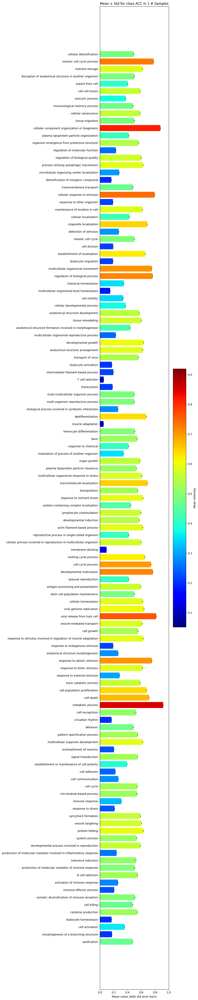

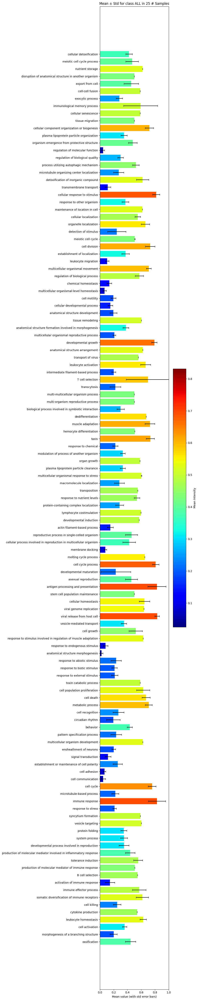

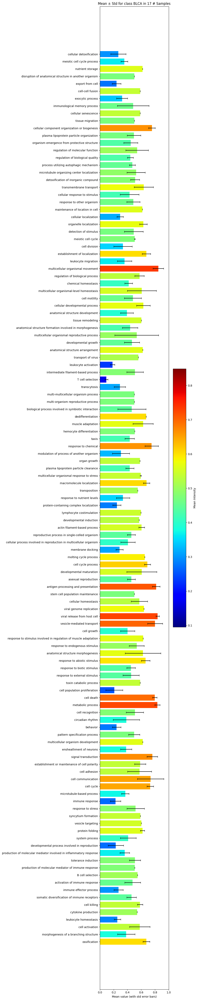

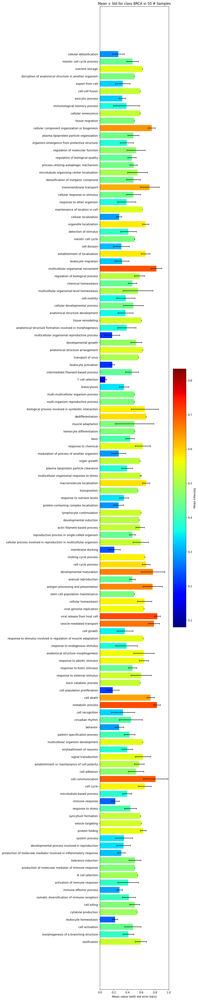

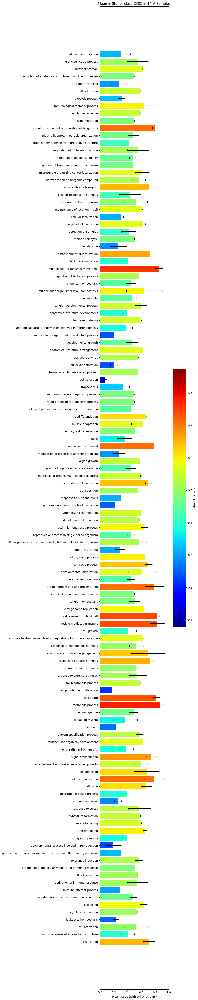

...

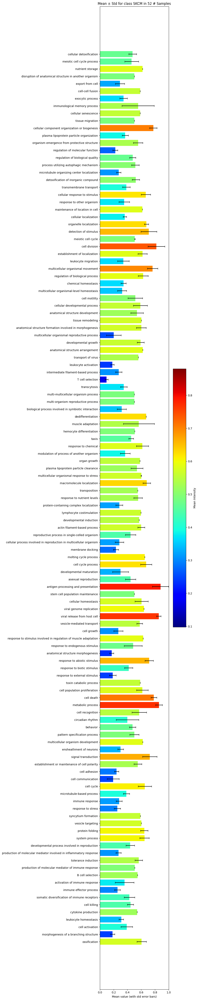

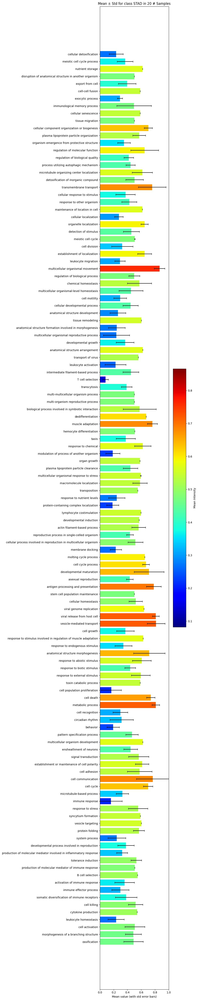

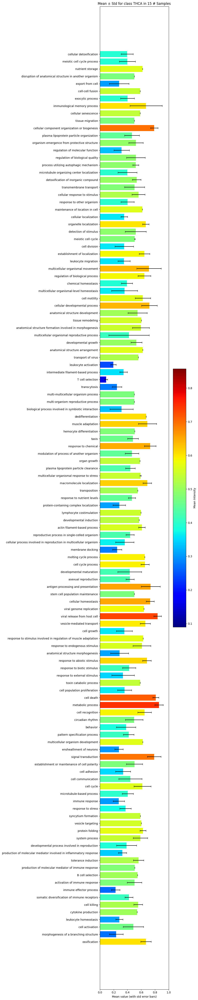

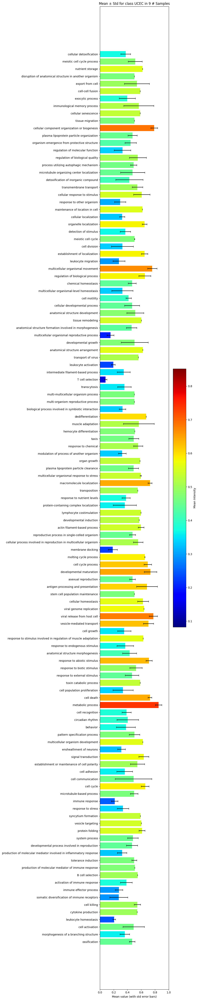

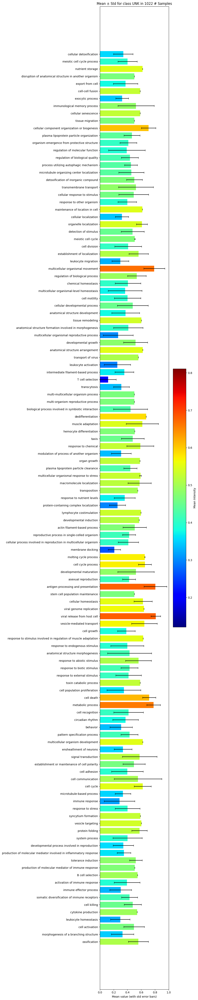

In [26]:
import numpy as np
import matplotlib.pyplot as plt
for class_idx in tqdm(range(len(classes))):
    # class_idx = 3
    classes_name = classes[class_idx]
    indices = all_labels == class_idx
    class_embeddings = all_embeddings[indices]
    means = class_embeddings.mean(axis=0)  # already in [0,1]
    stds = class_embeddings.std(axis=0)

    # --- use jet colormap
    cmap = cm.get_cmap('jet')
    colors = cmap(means)

    fig, ax = plt.subplots(figsize=(10, 50))

    bars = ax.barh(
        output_go_terms_name,
        means,
        xerr=stds,
        capsize=3,
        color=colors,
        ecolor='black'
    )

    ax.set_xlim(0, 1)
    ax.set_xlabel('Mean value (with std error bars)')
    ax.set_title(f'Mean ± Std for class {classes_name} in {indices.sum().item()} # Samples')

    # --- create ScalarMappable for the colorbar
    from matplotlib.cm import ScalarMappable
    sm = ScalarMappable(cmap=cmap)
    sm.set_array(means)  # needed for colorbar scale

    # attach colorbar to this figure/axes
    fig.colorbar(sm, ax=ax, label='Mean Intensity')

    plt.tight_layout()
    plt.savefig(f'/home/shervin/Thesis/Code/gene_ontology_autoencoder/plots/classes_variation_in_embedding_space/train_2/{classes_name.replace('/','_')}.png')

In [ ]:
from collections import Counter
c = Counter(all_labels)

3

array(None, dtype=object)